In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
from pso.PSO import *
from pso.delivery_swarm import *
working_path = os.pardir+'/'
%matplotlib inline
%matplotlib inline

## Utworzenie przypadku i zapis do pliku 
1. przed utworzeniem zrestartuj kernel
2. przy tworzeniu nowego przypadku zastosuj ./cases/NazwaPrzypadku(liczba_kurierów)k(liczba_zamówień)z(liczba_restauracji)r.txt


In [2]:
particle = DeliveryService(nr_couriers = 2, nr_orders = 8, nr_restaurants = 4)
filename =  '2c8o4r.txt'
particle.save_to_file(filename)


## Odtworzenie roju z pliku i eksperyment
Wykonaj eksperymenty dla różnych parametrów {inertia,cp,cg}

In [2]:
from pso.summary import *

In [3]:
import pandas as pd
from IPython.display import Image

## Badanie zachowania algorytmu dla różnej liczby osobników
* Wykonano eksperyment dla utworzonego wyżej przypadku testowego dla różnej liczby osobników 
* Według literatury osobników nie piowinno być więcej niż 40 
* Wybrano wartości: {5, 10, 15, 20, 25, 30, 35, 40} a także wartość 50 dla sprawdzenia hipotezy o zalecanej liczbie osobników
* Parametry zaufania `inertia` `cp` i `cg` ustalono na wartość 0.1

100%|██████████| 9/9 [21:43<00:00, 144.80s/it]


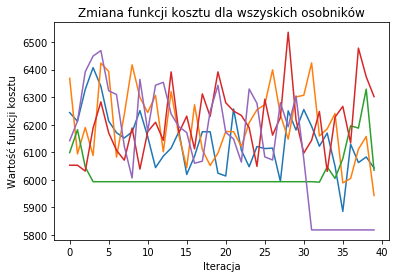

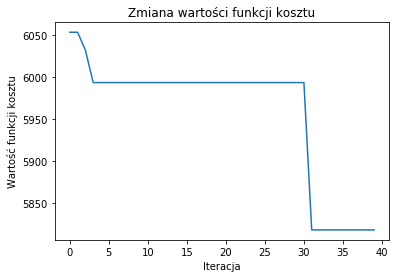

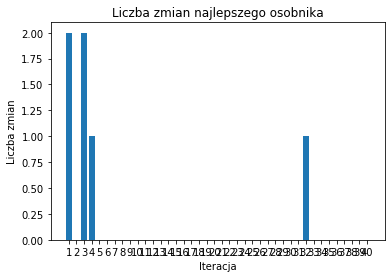

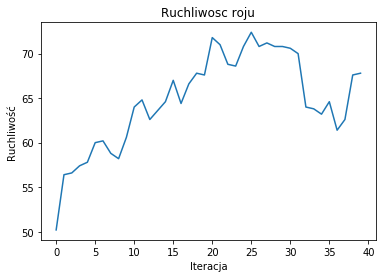

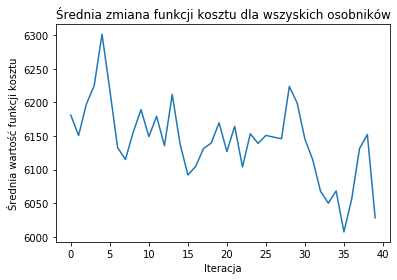

...

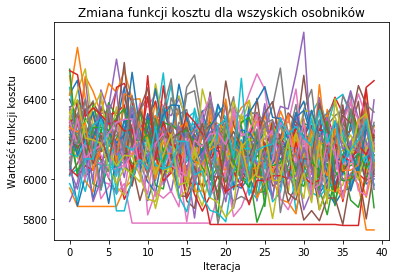

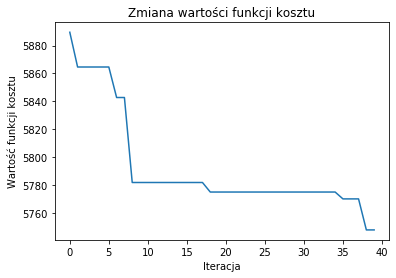

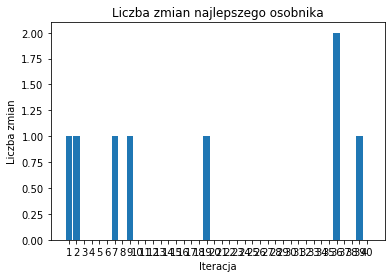

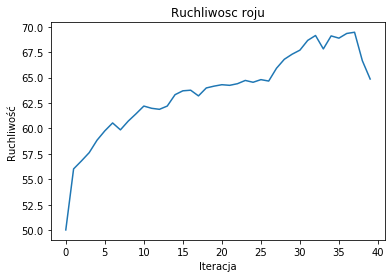

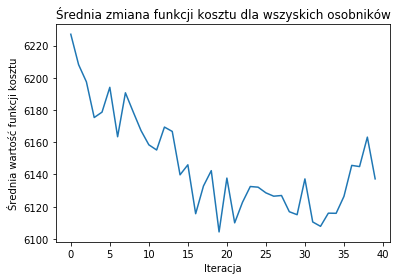

In [7]:
from pso.summary import *
import warnings
warnings.simplefilter("ignore")
from tqdm import tqdm
for nr_particles in tqdm([5, 10, 15, 20, 25, 30, 35, 40, 50]):
    
    run_pso_and_save_summary('przypadek10k500z10r.txt',nr_particles,0.1,0.1,0.1,40,draw_route=False)




In [27]:
experiments_logs = pd.read_csv('summary.csv')
experiment_data = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt']

In [28]:
experiment_data['loss'] = experiment_data['loss'].astype('float32')
experiment_data['nr_particles'] = experiment_data['nr_particles'].astype('float32')

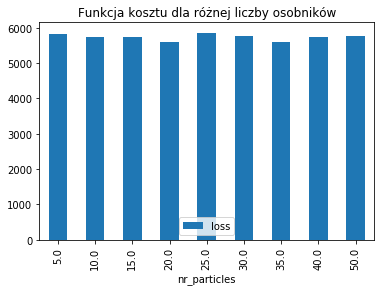

In [50]:
experiment_data.plot.bar('nr_particles','loss', title="Funkcja kosztu dla różnej liczby osobników")

In [49]:
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data['loss'].min()} \nDla liczby osobników: {experiment_data[experiment_data['loss']==experiment_data['loss'].min()]['nr_particles'].values[0]}")

Najmniejsza wartość funkcji kosztu: 5585.67333984375 
Dla liczby osobników: 20.0


In [65]:
time_performance = {k:experiment_data[k] for k in experiment_data.columns[1:6]}
time_performance['nr_particles'] = experiment_data['nr_particles']

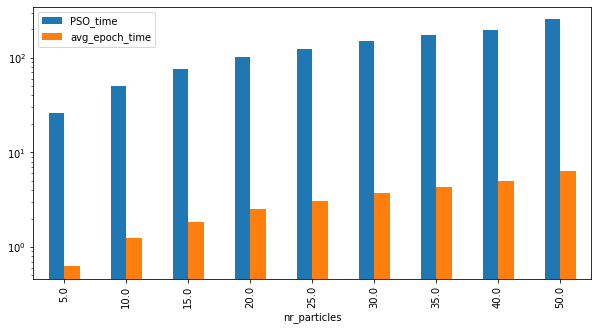

In [87]:
fif,ax =plt.subplots(figsize=(10,5))
time_performance=pd.DataFrame(time_performance)
time_performance.plot.bar(x = 'nr_particles',y = ['PSO_time','avg_epoch_time'], logy = True, ax = ax)

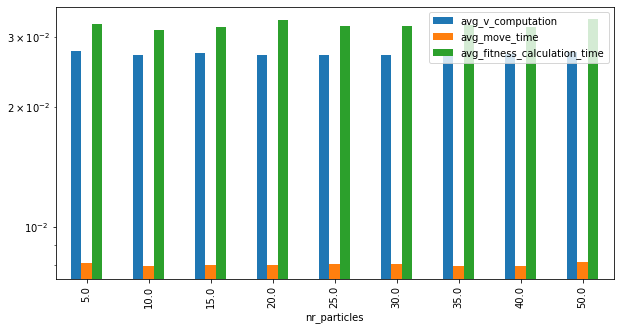

In [88]:
pd.DataFrame(time_performance).plot.bar(x = 'nr_particles',y = ['avg_v_computation','avg_move_time','avg_fitness_calculation_time'], logy = True,figsize=(10,5))

### Obserwacje 
* Konsekwencją więszej liczby osobników jest dłuższy czas trwania iteracji oraz co za tym idzie realizacji całego algorytmu.
* Liczba osobników nie wpływa na poszczególne kroki itracji wykonywane dla każdego osobnika (obliczenie prędkości, ruch, obliczenie wartości funkcji celu).
* Ruch jednoski ma najmniejszy wpływ na czas realizacji algorytmu
* Można zauważyć, że w lepszych rozwiązaniach średnia wartość funkcji celu podlega mniejszym wachaniom podczas kolejnych iteracji.
* Można zauważyć, że w lepszych rozwiązaniach średnia ruchliwość po osiągnięciu pewnego maksimum maleje w kolejnych iteracjach, co może świadczyś o podobieństwie kolejnych rozwiązań, zbliżenie się jednostek do pewnego optimum.

## Badanie wpływu ilości iteracji na przebieg alorytmu
* Do nastepnego etapu wybrano liczby osobników równe 20 oraz 35 jako najlepsze wyniki z poprzedniego doświadczenia.
* zbadano przebieg algorytmu dla zestawu powtórzeń {20, 30, 40,50,60}

100%|██████████| 5/5 [09:36<00:00, 115.31s/it]


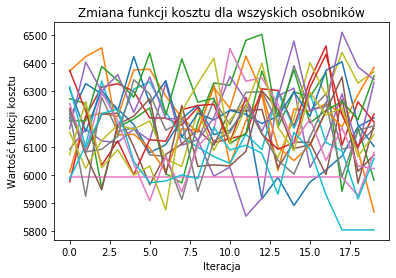

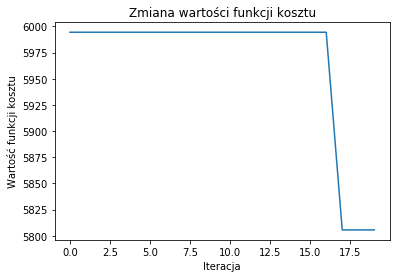

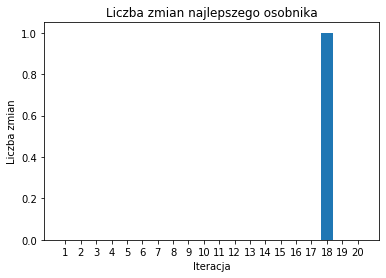

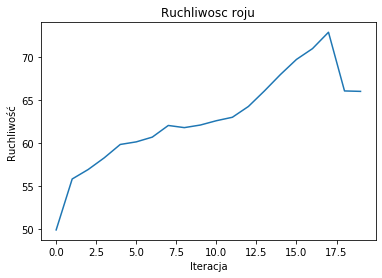

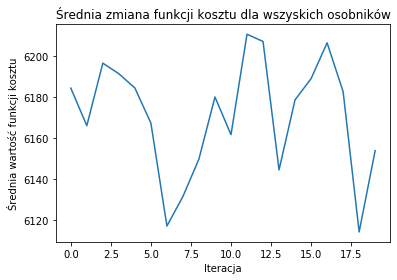

...

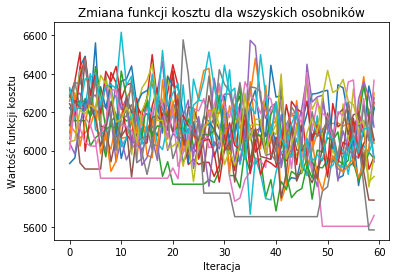

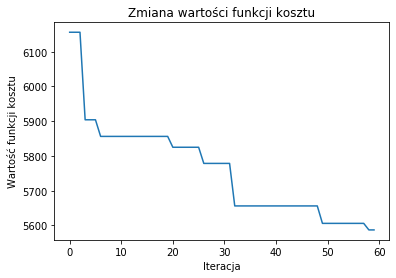

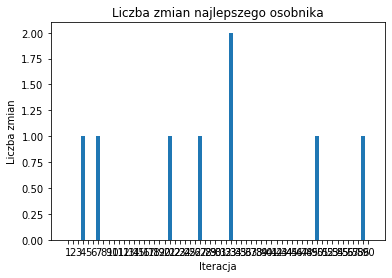

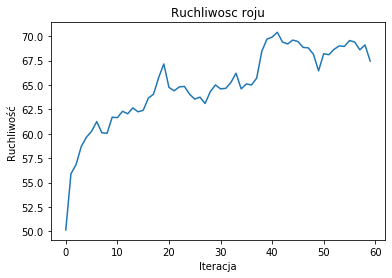

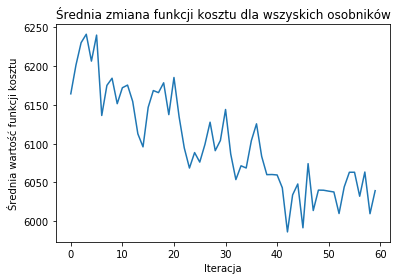

In [89]:

for nr_epoch in tqdm([20, 30, 40,50,60]):
    
    run_pso_and_save_summary('przypadek10k500z10r.txt',20,0.1,0.1,0.1,nr_epoch,draw_route=False)

100%|██████████| 5/5 [17:00<00:00, 204.07s/it]


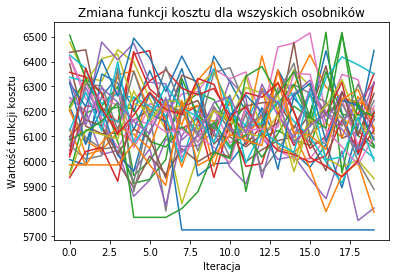

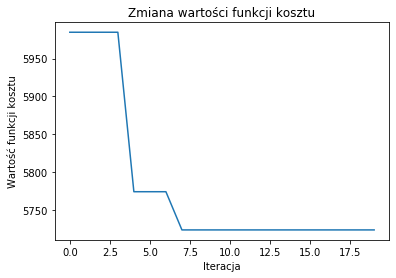

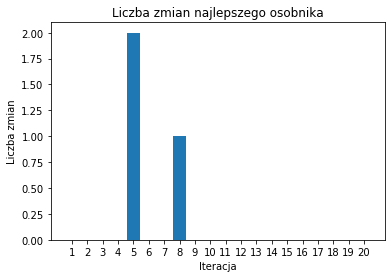

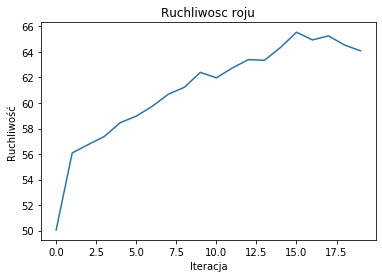

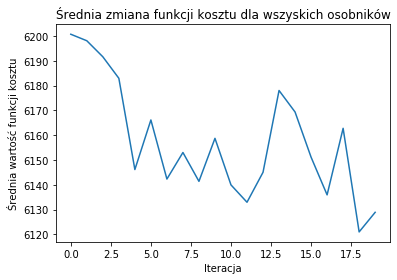

...

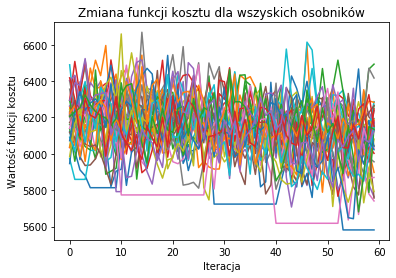

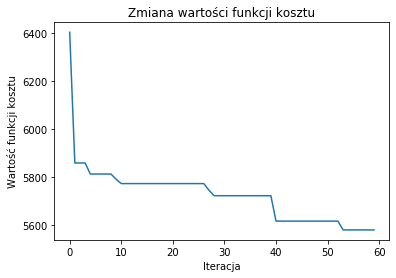

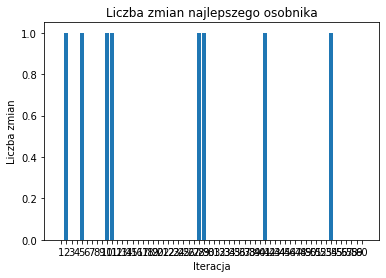

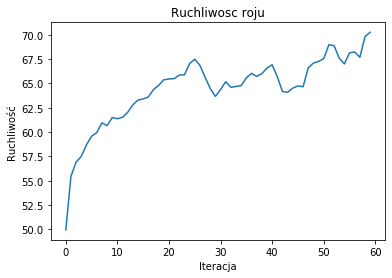

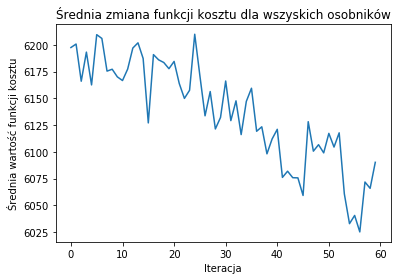

In [90]:
for nr_epoch in tqdm([20, 30, 40,50,60]):
    
    run_pso_and_save_summary('przypadek10k500z10r.txt',35,0.1,0.1,0.1,nr_epoch,draw_route=False)

In [96]:
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-10:]

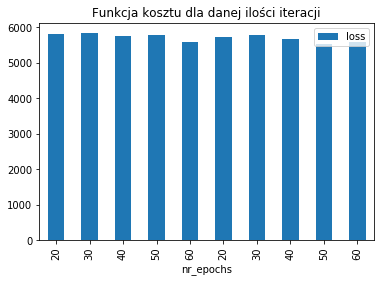

In [100]:
experiment_data2035.plot.bar('nr_epochs','loss', title="Funkcja kosztu dla danej ilości iteracji")

In [105]:
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \nDla liczby osobników: {experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]['nr_particles'].values[0]}\nIteracji: {experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]['nr_epochs'].values[0]}")

Najmniejsza wartość funkcji kosztu: 5513.71756174224 
Dla liczby osobników: 35
Iteracji: 50






  0%|          | 0/2 [00:00<?, ?it/s]




  0%|          | 0/3 [00:00<?, ?it/s]




 33%|███▎      | 1/3 [03:16<06:33, 196.75s/it]




 67%|██████▋   | 2/3 [06:52<03:22, 202.43s/it]




100%|██████████| 3/3 [10:39<00:00, 213.29s/it]




 50%|█████     | 1/2 [10:39<10:39, 639.86s/it]




  0%|          | 0/3 [00:00<?, ?it/s]




 33%|███▎      | 1/3 [05:30<11:00, 330.12s/it]




 67%|██████▋   | 2/3 [11:35<05:40, 340.70s/it]




100%|██████████| 3/3 [19:26<00:00, 388.92s/it]




100%|██████████| 2/2 [30:06<00:00, 903.32s/it]


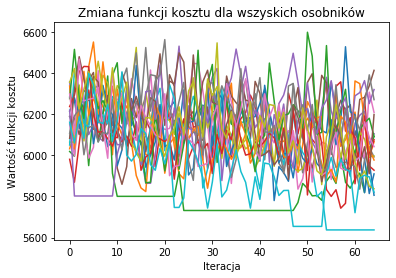

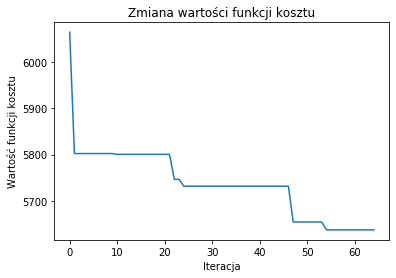

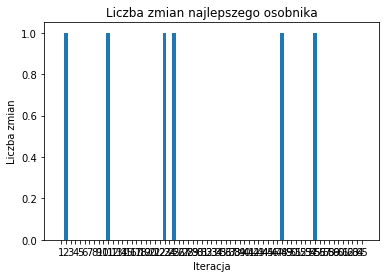

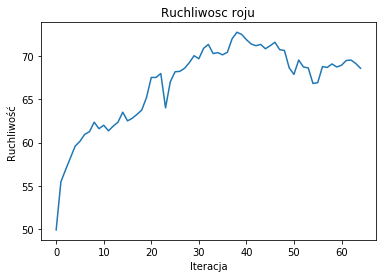

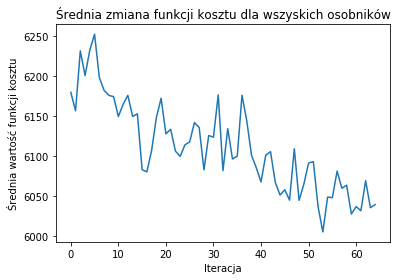

...

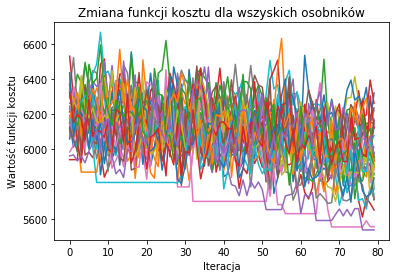

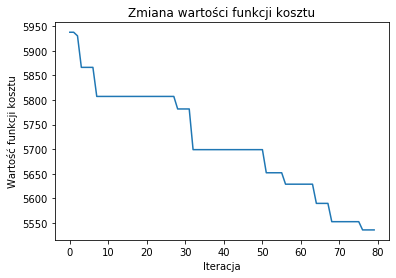

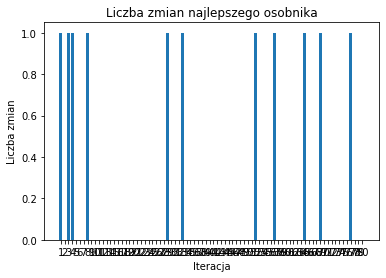

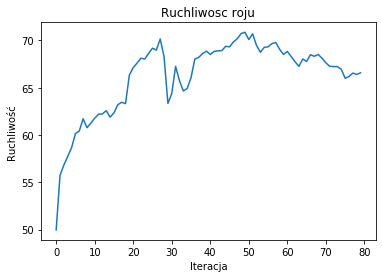

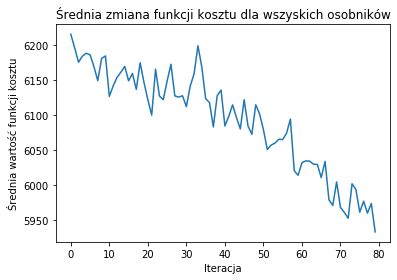

In [108]:
for nr_particles in tqdm([20, 35]):
    for nr_epoch in tqdm([65,75,80]):

        run_pso_and_save_summary('przypadek10k500z10r.txt',nr_particles,0.1,0.1,0.1,nr_epoch,draw_route=False)

In [109]:
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-6:]

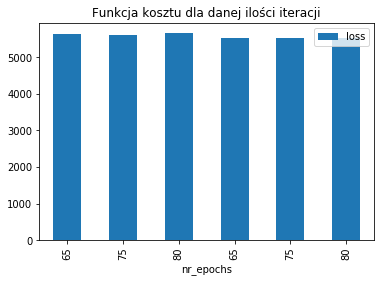

In [110]:
experiment_data2035.plot.bar('nr_epochs','loss', title="Funkcja kosztu dla danej ilości iteracji")

In [111]:
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \nDla liczby osobników: {experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]['nr_particles'].values[0]}\nIteracji: {experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]['nr_epochs'].values[0]}")

Najmniejsza wartość funkcji kosztu: 5520.826920839756 
Dla liczby osobników: 35
Iteracji: 75


### Obserwacje
* Zwiększenie liczby iteracji do poziomu ok 50 poprawia wartość fukncji celu
* Dalsze zwiększanie liczby iteracji nie poprawa znacząco funkcji celu


## Badanie przebiegu algorytmu w zależności od parametrów zaufania
Badano prebieg działania algorytmu w zalezności od wartości parametrów `inertia` `cp` `cg` dla 20 osobników oraz liczbie iteracji równej 50 (najlepszej wyselekcjonowanej z poprzedniego eksperymentu)

* wartości parametrów dobrano odpowiednio {0.01,0.2,0.5,0.8} dla każdego pzypadku  







  0%|          | 0/10 [00:00<?, ?it/s]




 10%|█         | 1/10 [06:34<59:08, 394.28s/it]




 20%|██        | 2/10 [12:22<50:44, 380.59s/it]




 30%|███       | 3/10 [19:01<45:02, 386.01s/it]




 40%|████      | 4/10 [25:52<39:21, 393.52s/it]




 50%|█████     | 5/10 [32:05<32:16, 387.39s/it]




 60%|██████    | 6/10 [37:51<24:59, 374.99s/it]




 70%|███████   | 7/10 [44:10<18:48, 376.03s/it]




 80%|████████  | 8/10 [49:27<11:56, 358.28s/it]




 90%|█████████ | 9/10 [55:07<05:52, 352.94s/it]




100%|██████████| 10/10 [1:01:18<00:00, 367.87s/it]


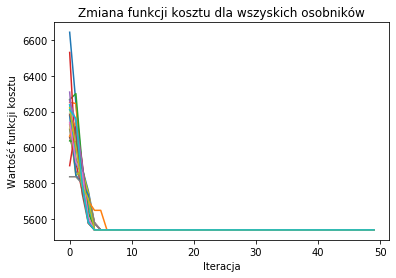

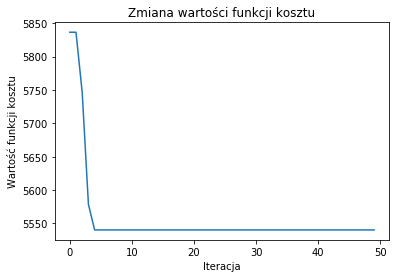

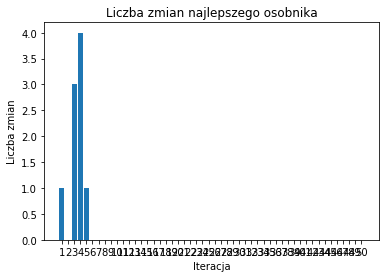

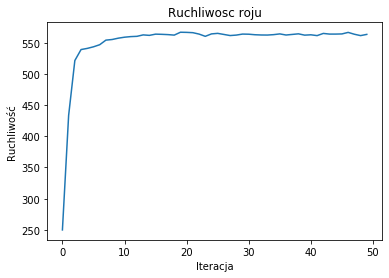

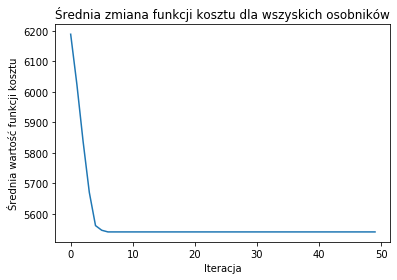

...

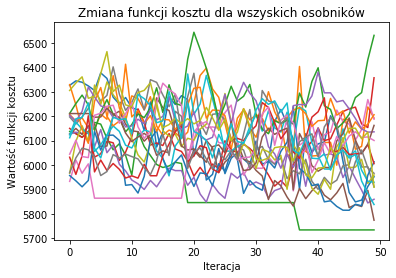

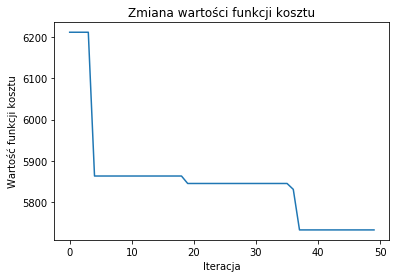

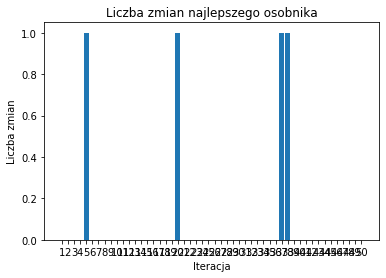

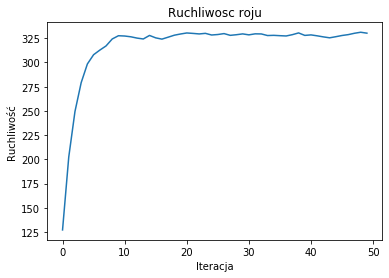

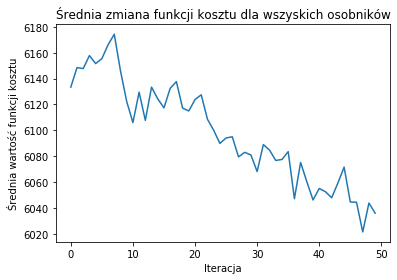

In [114]:

for param in tqdm(range(10)):
    inertia = np.random.choice([0.01,0.2,0.5,0.8])
    cp = np.random.choice([0.01,0.2,0.5,0.8])
    cg = np.random.choice([0.01,0.2,0.5,0.8])
    run_pso_and_save_summary('przypadek10k500z10r.txt',20,inertia,cp,cg,50,draw_route=False)
        

Najmniejsza wartość funkcji kosztu: 5445.9981686378205 
Dla liczby iteracji: 50
cp: 0.2
cg: 0.2
inertia:0.8


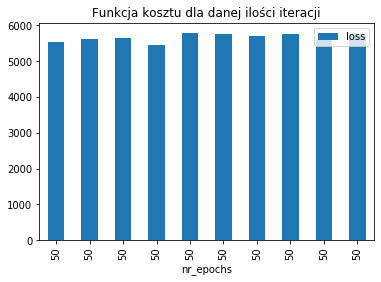

In [123]:
import matplotlib.image as mpimg
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-10:]
experiment_data2035.plot.bar('nr_epochs','loss', title="Funkcja kosztu dla danej ilości iteracji")
best = experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \nDla liczby iteracji: {best['nr_epochs'].values[0]}\ncp: {best['cp'].values[0]}\ncg: {best['cg'].values[0]}\ninertia:{best['inertia'].values[0]}")

### Obserwacje
Dobór parametrów w losowy sposób nie porawił wartości funkcji celu. Przy dostosowywaniu parametrów należy kierować sie wiedzą na temat ich wpływu na działanie algorytmu, oraz dozosować ich wartość do specyfiki problemu.

## Badanie wpływu kolejnych parametrów na działanie algorytmu
W poniższych rozważniach wybrano małą liczbę osobników aby możliwe było monitorowanie przebieku kazdego z nich i prezentacja na wykresie, ale również ich wzajemny wpływ na siebie. 

### Badanie wpływy parametru `inertia`
Aby zbadać wpływ parametru inertia, przeprowadzimy eksperyment da 5 jednostek, 40 iteracji oraz wybranych wartości parametru `inertia`.  Parametry `cp` i `cg` ustawiam na 0.1 wyzerowanie parametrów spowodowałoby całkowity brak ruchu jednostek. 

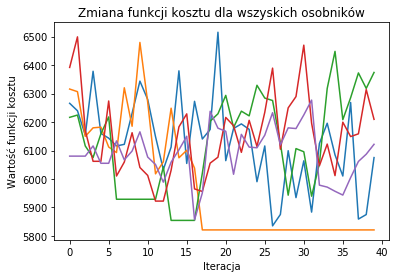

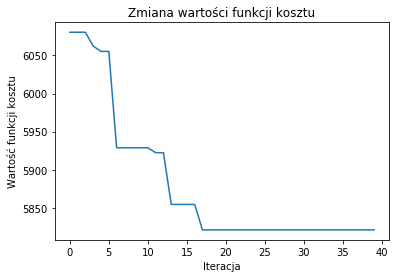

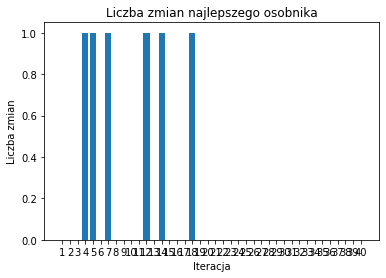

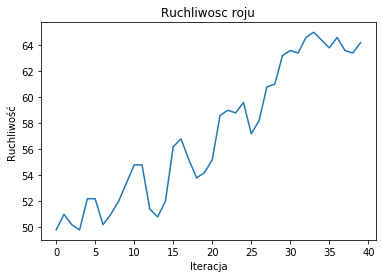

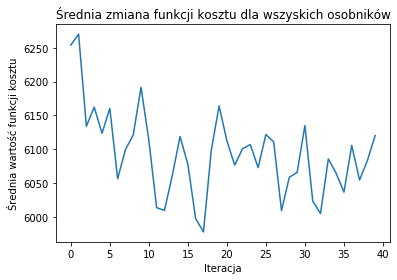

...

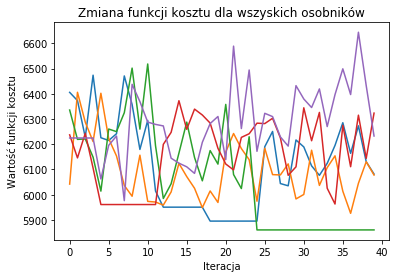

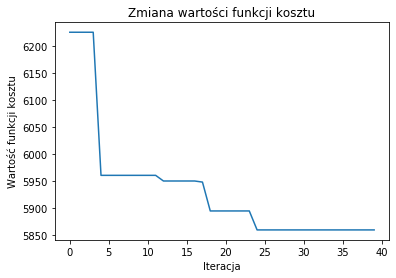

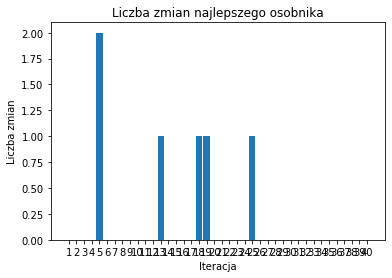

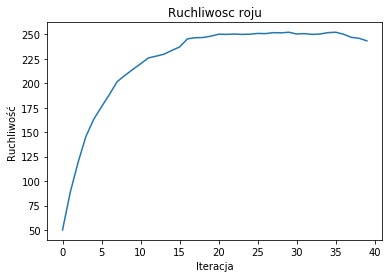

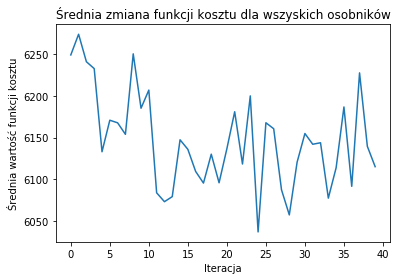

In [128]:
for inertia in [0.01,0.2,0.5,0.8]:
    run_pso_and_save_summary('przypadek10k500z10r.txt',5,inertia,0.1,0.1,40,draw_route=False)

Najmniejsza wartość funkcji kosztu: 5494.674615080045 
inertia:0.5


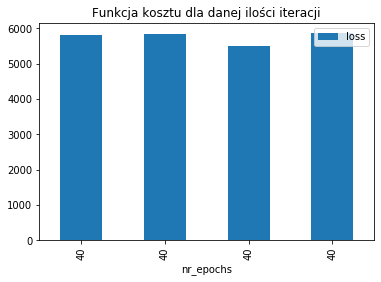

In [129]:
import matplotlib.image as mpimg
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-4:]
experiment_data2035.plot.bar('nr_epochs','loss', title="Funkcja kosztu dla danej ilości iteracji")
best = experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \ninertia:{best['inertia'].values[0]}")
      

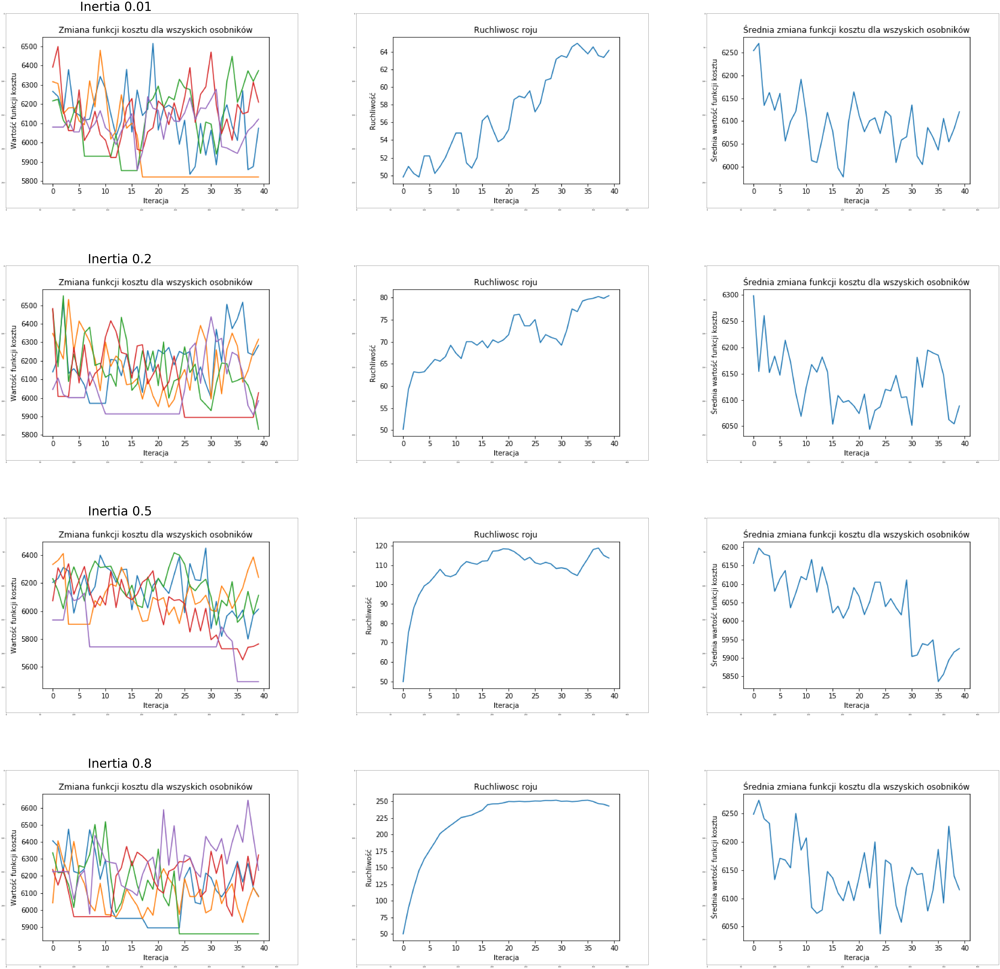

In [189]:
fig = plt.figure(figsize=(100,100),dpi=80)
inertia = [0.01,0.2,0.5,0.8]
for case,row in zip(experiment_data2035['particles_history_plot'],range(4)):
    
    plt.subplot(4, 3, 3*row+1)
    plt.imshow(mpimg.imread(case,'png'))
    plt.title( label = f'Inertia {inertia[row]}', fontdict={'fontsize': 70,'fontweight' : None, 'verticalalignment': 'baseline', 'horizontalalignment': 'right'} )
    
    
    plt.subplot(4, 3, 3*row+2)
    plt.imshow(mpimg.imread('mobility_plots/'+case.split('/')[1],'png'))
    
    plt.subplot(4, 3, 3*row+3)
    plt.imshow(mpimg.imread('draw_avg_swarm_loss_plots/'+case.split('/')[1],'png'))
    
        
    

#### Obserwacje
* Paramert inertia bez zastosowania innych parametrów nie wprowadza zmian niezależnie od wartości
* Zwiększanie parametru inertia wprowadza ztabilizację w ruchliwości roju, co ogranicza możliwość ingerencji w prędkosć dla najlepszej pozycji osobnika i najlepszej pozycji w roju.
* Optymalna watrość parametru dla wybranego z podanego zestau to 0.5. Dla tej wartości widoczna jest względna stabilizacja ruchliwości w liczbie iteracji oraz najbardzej konsekwentna poprawa funkcji celu,  a taże najmniejsza wariancja wartości dla poszczególnych osobników


### Badanie wpływy parametru `cp`
Aby zbadać wpływ parametru `cp`, przeprowadzimy eksperyment da 5 jednostek, 40 iteracji oraz wybranych wartości parametru `cp`.  Parametry `inertia` i `cg` ustawionono wzorcowe 0.1. 

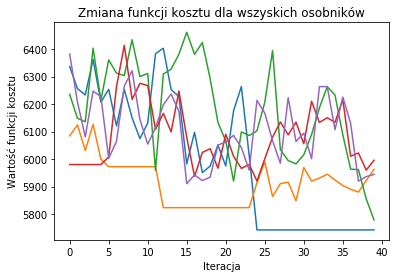

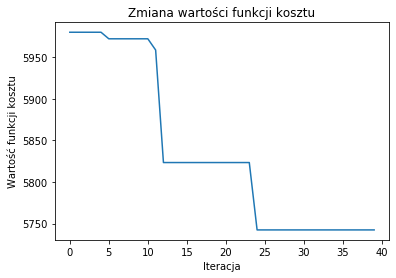

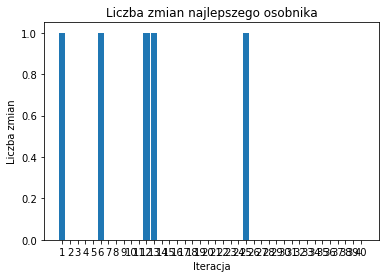

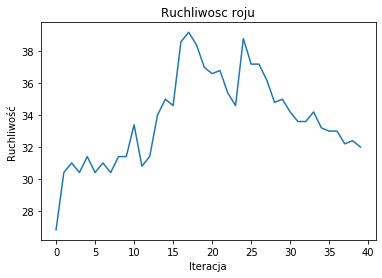

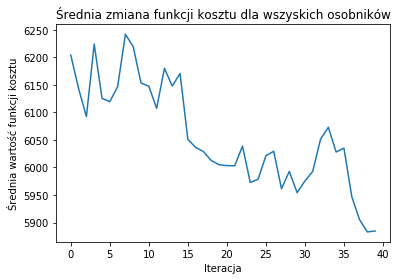

...

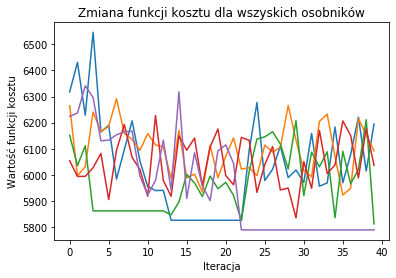

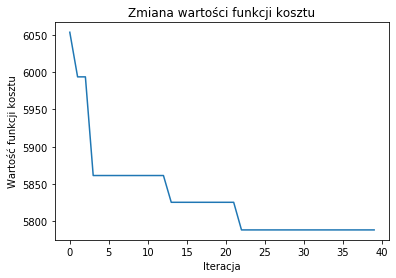

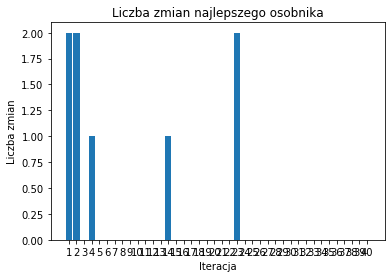

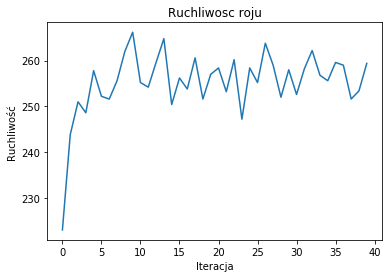

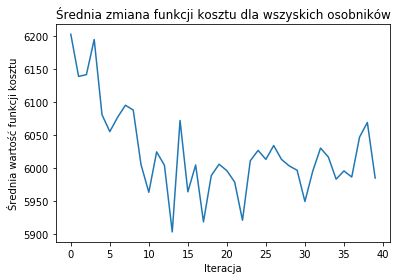

In [193]:
for cp in [0.01,0.2,0.5,0.8]:
    run_pso_and_save_summary('przypadek10k500z10r.txt',5,0.1,cp,0.1,40,draw_route=False)

Najmniejsza wartość funkcji kosztu: 5669.332518807238 
cp:0.2


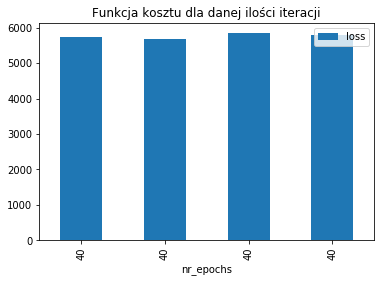

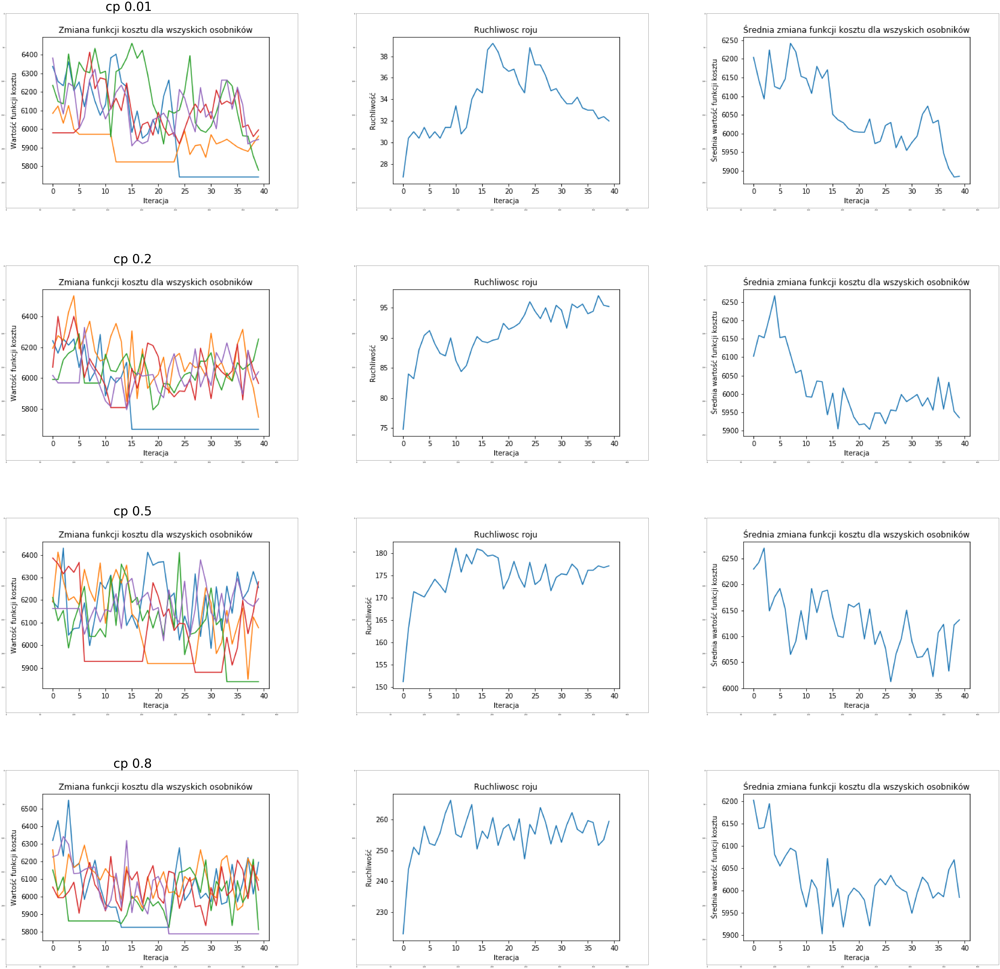

In [197]:
import matplotlib.image as mpimg
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-4:]
experiment_data2035.plot.bar('nr_epochs','loss', title="Funkcja kosztu dla danej ilości iteracji")
best = experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \ncp:{best['cp'].values[0]}")
      
fig = plt.figure(figsize=(100,100),dpi=80)
cp = [0.01,0.2,0.5,0.8]
for case,row in zip(experiment_data2035['particles_history_plot'],range(4)):
    
    plt.subplot(4, 3, 3*row+1)
    plt.imshow(mpimg.imread(case,'png'))
    plt.title( label = f'cp {cp[row]}', fontdict={'fontsize': 70,'fontweight' : None, 'verticalalignment': 'baseline', 'horizontalalignment': 'right'} )
    
    
    plt.subplot(4, 3, 3*row+2)
    plt.imshow(mpimg.imread('mobility_plots/'+case.split('/')[1],'png'))
    
    plt.subplot(4, 3, 3*row+3)
    plt.imshow(mpimg.imread('draw_avg_swarm_loss_plots/'+case.split('/')[1],'png'))

#### Obserwacje
Wartość `cp` odpowiadają za utrzymywanie się blisko własnego minimum.
* Im większa wartość `cp` tym mniejsze wachania dla poszczególnych osobników oraz mniejsza szybkosć zbieżności
* Dla wysokich wartości cp ruchliwość trymuje sie na najwyższym osiągniętym poziomie, dla mniejszych maleje do pierwotnej wartości po osiągnięciu maksimum

### Badanie wpływy parametru inertia `cg`
Aby zbadać wpływ parametru inertia, przeprowadzimy eksperyment da 5 jednostek, 40 iteracji oraz wybranych wartości parametru `cg`.  Parametry `inertia` i `cp` ustawionono wzorcowe 0.1. 

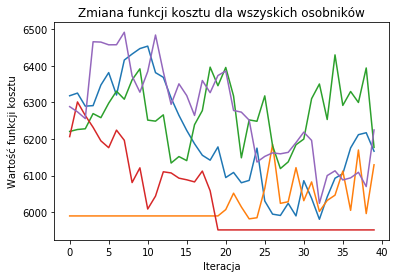

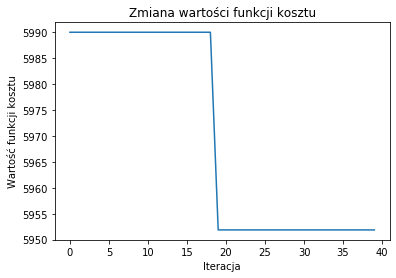

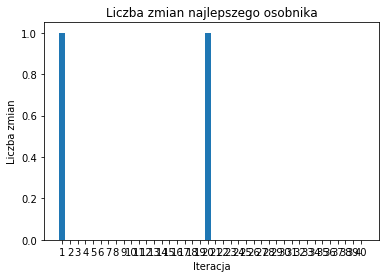

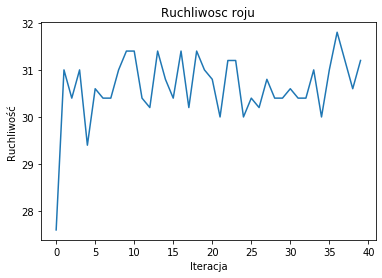

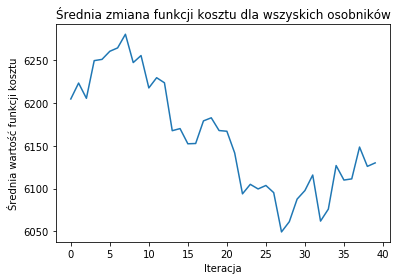

...

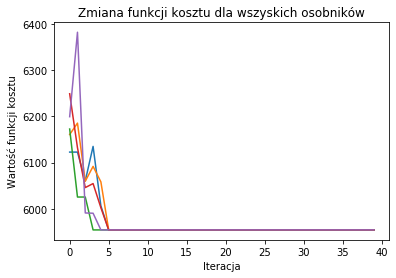

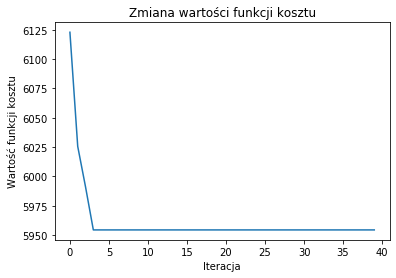

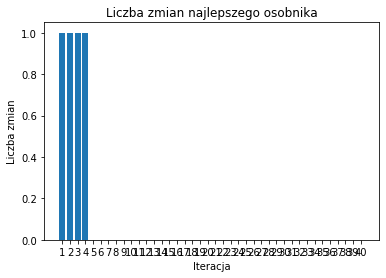

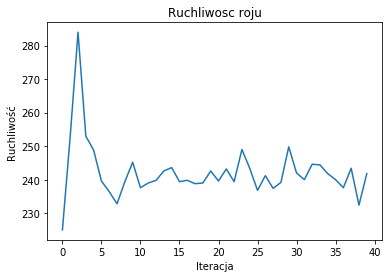

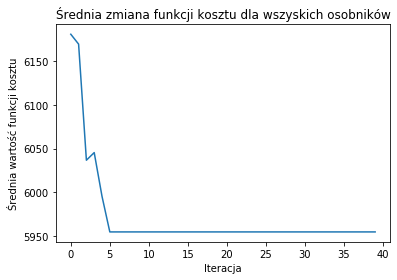

In [198]:
for cg in [0.01,0.2,0.5,0.8]:
    run_pso_and_save_summary('przypadek10k500z10r.txt',5,0.1,0.1,cg,40,draw_route=False)

Najmniejsza wartość funkcji kosztu: 5637.854939051676 
cg:0.2


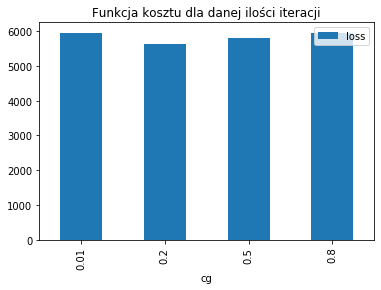

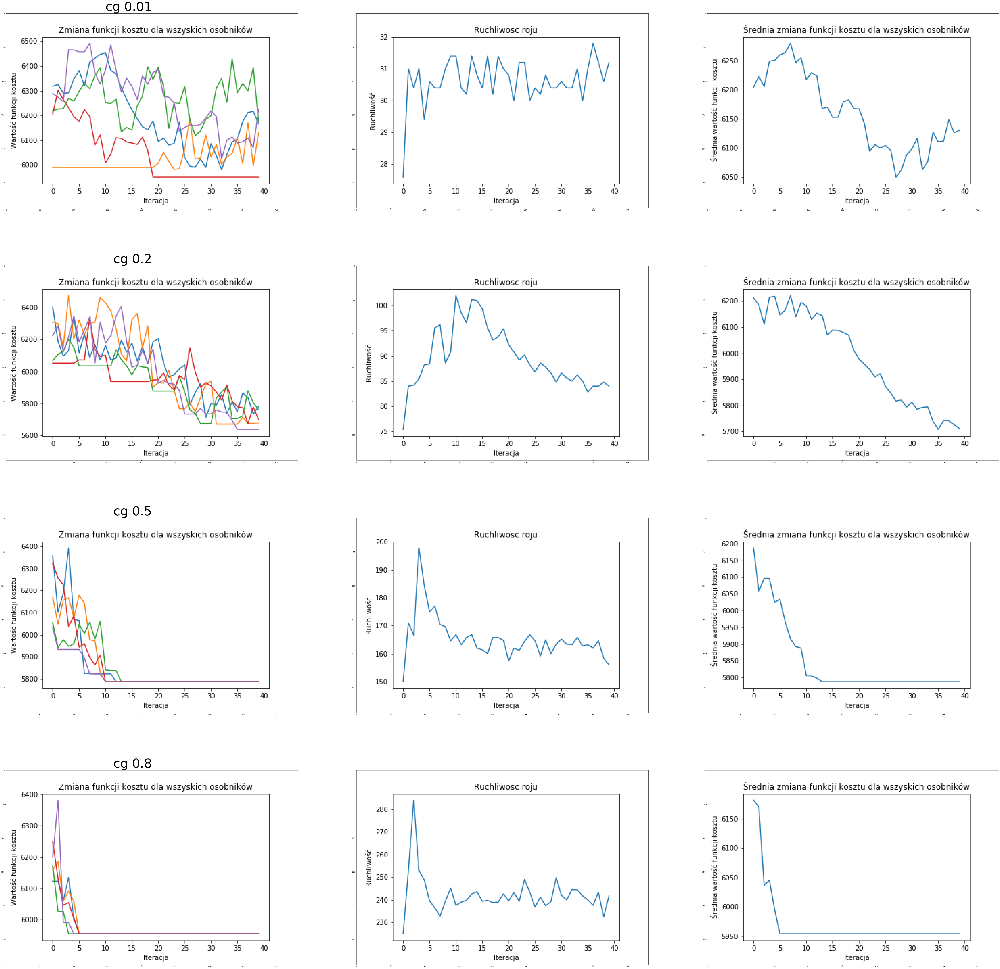

In [200]:
import matplotlib.image as mpimg
experiments_logs = pd.read_csv('summary.csv')
experiment_data2035 = experiments_logs[experiments_logs['case_name']=='przypadek10k500z10r.txt'][-4:]
experiment_data2035.plot.bar('cg','loss', title="Funkcja kosztu dla danej ilości iteracji")
best = experiment_data2035[experiment_data2035['loss']==experiment_data2035['loss'].min()]
print(f"Najmniejsza wartość funkcji kosztu: {experiment_data2035['loss'].min()} \ncg:{best['cg'].values[0]}")
      
fig = plt.figure(figsize=(100,100),dpi=80)
cg = [0.01,0.2,0.5,0.8]
for case,row in zip(experiment_data2035['particles_history_plot'],range(4)):
    
    plt.subplot(4, 3, 3*row+1)
    plt.imshow(mpimg.imread(case,'png'))
    plt.title( label = f'cg {cg[row]}', fontdict={'fontsize': 70,'fontweight' : None, 'verticalalignment': 'baseline', 'horizontalalignment': 'right'} )
    
    
    plt.subplot(4, 3, 3*row+2)
    plt.imshow(mpimg.imread('mobility_plots/'+case.split('/')[1],'png'))
    
    plt.subplot(4, 3, 3*row+3)
    plt.imshow(mpimg.imread('draw_avg_swarm_loss_plots/'+case.split('/')[1],'png'))

#### Obserwacje
* Zwiększenie wartości parametru `cg` przyspiesza zbierzność algorytmu
* Poczatkowo ruchliwośc jest bardzo duża, osobniki szybko zbegają do rozwiązania bliskiego najlepszemu w roju
* Zbyt wysoka wartość `cg` powoduje utknięcie w lokalnym minimum reprezentowanym przez pierwotnie najlepszy element
* Ruchliwość szybko rośnie aby po szybkim osiągnięciu przez osobniki minimum ustabilizować sie na pewnym poziomie

### Wnoski z analizy parametrów PSO
Eksperymenty potwierdzają, że dane wartości parametrów realizują założenia związane z nimi. 
1. Podstawowe własoności poszczególnych parametrów:


* `inertia` określa na jakie odstępstwa od obecnej prędkości (zmianę kierunku) można pozwolić osobnikowi, zwiększenie parametru zmniejsza wpływ najlepszych wartości dla roju i osobnika, zwiększa znaczenie obecnej prędkości osobnika.
* `cp` określa zaufanie do własnej, historycznie najlepszej pozycji. Zmniejszenie wartości `cp` zwększa ruchliwość jednoski pozwala na wieksze zmiany w prędkości, "śmielszy" ruch osobnika.
* `cg` określa wpływ najlepszej jednoski na ruch pozostałych, przyspiesza zbieżność. Zbyt wysoka wartość powoduje utknięcie w lokalnym minimum.


2. Parametry należy stosować ostożnie przy aby uzyskaś optymalne rozwiązanie.
* Zbyt niskie wartości `cg` i `inertia` oraz zbyt wysoki `cp`, uniemożliwiają zmiany rozwiąznia, niewielki ruch osobników nie pozwala na przegląd duzej liczby rozwiązań, a w konsekwencji znalezienie najlepszego rozwiązania.
* Zbyt wysoka wartośc parametru `inertia` zawęża tor ruchu, `cp` zmniejsza możliwośc ruchu w kierunku innych rozwiązań, `cg` przyspiesza ruch w kierunku lokalnego minimum, które może okazać się nieoptymalnym rozwiązaniem.
* Zastosowanie wyższeych wartości parametrów pomaga osiagnąc dobre rozwiązanie w małej liczbie iteracji, zawęża jednak obszar poszukiwań.

